## Google Driveのマウント

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## データセットの準備

In [ ]:
# kaggle ライブラリのインストール
!pip install kaggle

# 一時フォルダに .kaggleフォルダを作成
!mkdir ~/.kaggle

# MyDrive の kaggle.json を一時フォルダ内の .kaggleフォルダにコピー
!cp /content/drive/MyDrive/kaggle/kaggle.json ~/.kaggle/

# アクセス権限の設定
!chmod 600 ~/.kaggle/kaggle.json

!mkdir ~/.kaggle

# zipファイルのダウンロード
!kaggle datasets download -d ashaheedq/video-games-sales-2019 -p /content/drive/MyDrive/kaggle

# 解凍
!unzip /content/drive/MyDrive/kaggle/video-games-sales-2019.zip -d /content/drive/MyDrive/kaggle

!rm /content/drive/MyDrive/kaggle/video-games-sales-2019.zip

mkdir: cannot create directory ‘/root/.kaggle’: File exists
  0% 0.00/3.98M [00:00<?, ?B/s]
100% 3.98M/3.98M [00:00<00:00, 62.9MB/s]
Archive:  /content/drive/MyDrive/kaggle/video-games-sales-2019.zip
replace /content/drive/MyDrive/kaggle/vgsales-12-4-2019-short.csv? [y]es, [n]o, [A]ll, [N]one, [r]ename: None


## データの読込

In [ ]:
import pandas as pd
df = pd.read_csv("/content/drive/MyDrive/kaggle/vgsales-12-4-2019.csv")
df.head(3)

,Rank,Name,basename,Genre,ESRB_Rating,Platform,Publisher,Developer,VGChartz_Score,Critic_Score,User_Score,Total_Shipped,Global_Sales,NA_Sales,PAL_Sales,JP_Sales,Other_Sales,Year,Last_Update,url,status,Vgchartzscore,img_url
0,1,Wii Sports,wii-sports,Sports,E,Wii,Nintendo,Nintendo EAD,NaN,7.7,NaN,82.86,NaN,NaN,NaN,NaN,NaN,2006.0,NaN,http://www.vgchartz.com/game/2667/wii-sports/?...,1,NaN,/games/boxart/full_2258645AmericaFrontccc.jpg
1,2,Super Mario Bros.,super-mario-bros,Platform,NaN,NES,Nintendo,Nintendo EAD,NaN,10.0,NaN,40.24,NaN,NaN,NaN,NaN,NaN,1985.0,NaN,http://www.vgchartz.com/game/6455/super-mario-...,1,NaN,/games/boxart/8972270ccc.jpg
2,3,Mario Kart Wii,mario-kart-wii,Racing,E,Wii,Nintendo,Nintendo EAD,NaN,8.2,9.1,37.14,NaN,NaN,NaN,NaN,NaN,2008.0,11th Apr 18,http://www.vgchartz.com/game/6968/mario-kart-w...,1,8.7,/games/boxart/full_8932480AmericaFrontccc.jpg


In [ ]:
import os
import numpy as np
import random

In [ ]:
# シード値の固定
SEED = 42

random.seed(SEED)
os.environ['PYTHONHASHSEED'] = str(SEED)
np.random.seed(SEED)

## 01 EDA

In [ ]:
!pip install matplotlib-venn
!pip install sweetviz
!pip install pandas-profiling==2.8.0
!pip install  pandas==1.2.4

None
     |████████████████████████████████| 15.1 MB 5.4 MB/s 
     |████████████████████████████████| 259 kB 5.4 MB/s 
     |████████████████████████████████| 59 kB 6.1 MB/s 
     |████████████████████████████████| 675 kB 46.4 MB/s 
     |████████████████████████████████| 4.7 MB 35.9 MB/s 
     |████████████████████████████████| 812 kB 50.2 MB/s 
     |████████████████████████████████| 38.1 MB 1.5 MB/s 
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27098 sha256=2338ad514c05ab09a90f192d718f84369a00579150b308bd04581dfd14bb8899
  Stored in directory: /root/.cache/pip/wheels/70/e1/52/5b14d250ba868768823940c3229e9950d201a26d0bd3ee8655
  Created wheel for imagehash: filename=ImageHash-4.2.1-py2.py3-none-any.whl size=295207 sha256=1b3a6bc9cf5356391e7a2538d60c92ff0b526af1975b0d78185f8ecec0fe4b84
  Stored in directory: /root/.cache/pip/wheels/4c/d5/59/5e3e297533ddb09407769762985d134135064c6831e29a914e
Successfully built htmlmin imagehash
  Attempting uninstall: sci

## describe

In [ ]:
df.describe(include='all')

,Rank,Name,basename,Genre,ESRB_Rating,Platform,Publisher,Developer,VGChartz_Score,Critic_Score,User_Score,Total_Shipped,Global_Sales,NA_Sales,PAL_Sales,JP_Sales,Other_Sales,Year,Last_Update,url,status,Vgchartzscore,img_url
count,55792.000000,55792,55792,55792,23623,55792,55792,55775,0.0,6536.000000,335.000000,1827.000000,19415.000000,12964.000000,13189.000000,7043.000000,15522.000000,54813.000000,9186,55792,55792.0,799.000000,55792
unique,NaN,37102,36672,20,8,74,3069,8064,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,430,55791,NaN,NaN,47601
top,NaN,Plants vs. Zombies,fate,Misc,E,PC,Unknown,Unknown,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,29th Mar 19,http://www.vgchartz.com/game/41330/gran-turism...,NaN,NaN,/games/boxart/default.jpg
freq,NaN,20,23,9476,10811,10978,4891,4756,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,227,2,NaN,NaN,8178
mean,27896.500000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.213709,8.253433,1.887258,0.365503,0.275541,0.155263,0.110402,0.044719,2005.659095,NaN,NaN,1.0,7.425907,NaN
std,16105.907446,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.454079,1.401489,4.195693,0.833022,0.512809,0.399257,0.184673,0.129554,8.355585,NaN,NaN,0.0,1.384226,NaN
min,1.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.000000,2.000000,0.030000,0.000000,0.000000,0.000000,0.000000,0.000000,1970.000000,NaN,NaN,1.0,2.600000,NaN
25%,13948.750000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.400000,7.800000,0.200000,0.030000,0.050000,0.010000,0.020000,0.000000,2000.000000,NaN,NaN,1.0,6.800000,NaN
50%,27896.500000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.500000,8.500000,0.590000,0.120000,0.120000,0.040000,0.050000,0.010000,2008.000000,NaN,NaN,1.0,7.800000,NaN
75%,41844.250000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.300000,9.100000,1.800000,0.360000,0.290000,0.140000,0.120000,0.040000,2011.000000,NaN,NaN,1.0,8.500000,NaN


## Pandas-Profile

In [ ]:
from pandas_profiling import ProfileReport

profile = ProfileReport(df, title="Pandas Profiling Report")
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/37 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## Sweetviz

                                             |          | [  0%]   00:00 -> (? left)

Report SWEETVIZ_REPORT.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.



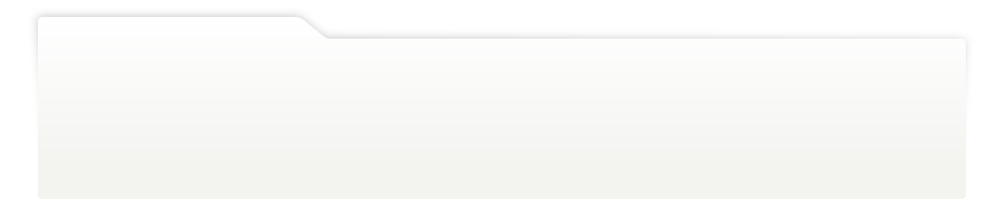
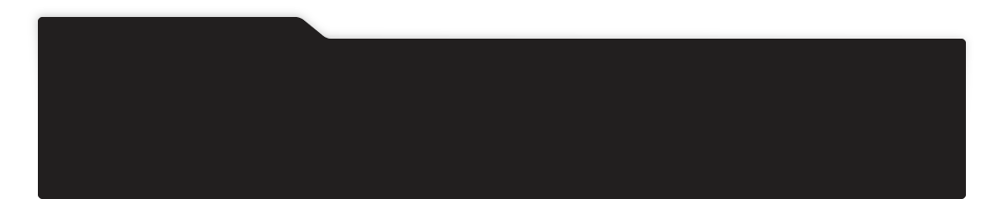
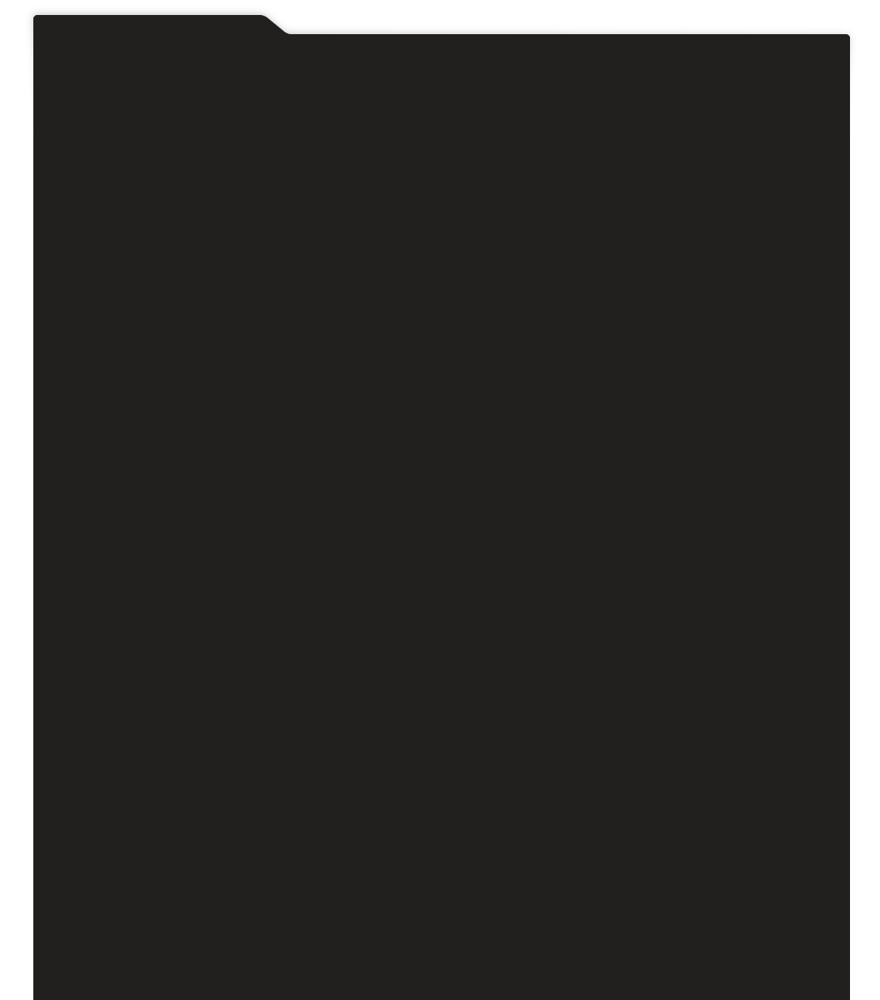
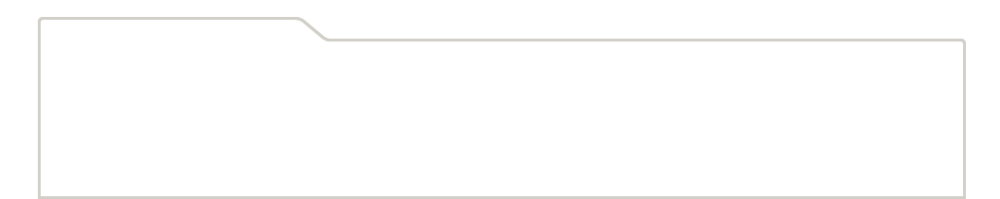
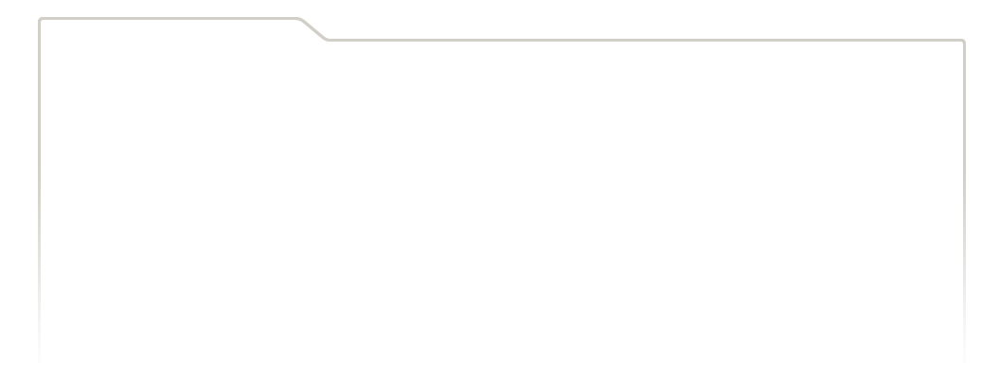
...
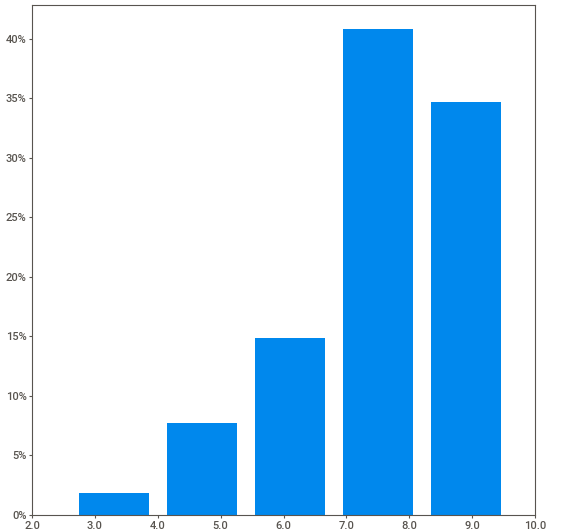
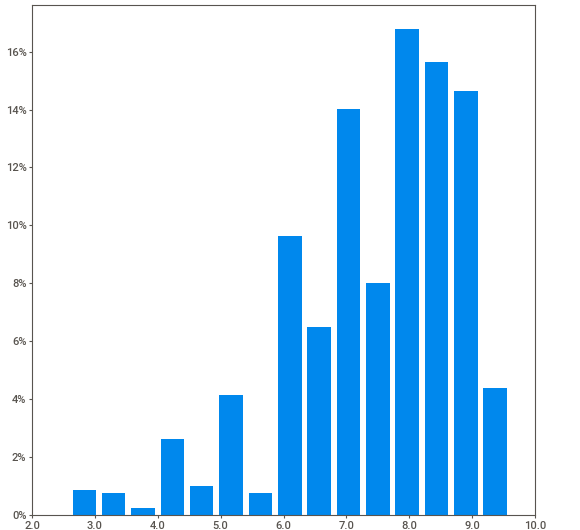
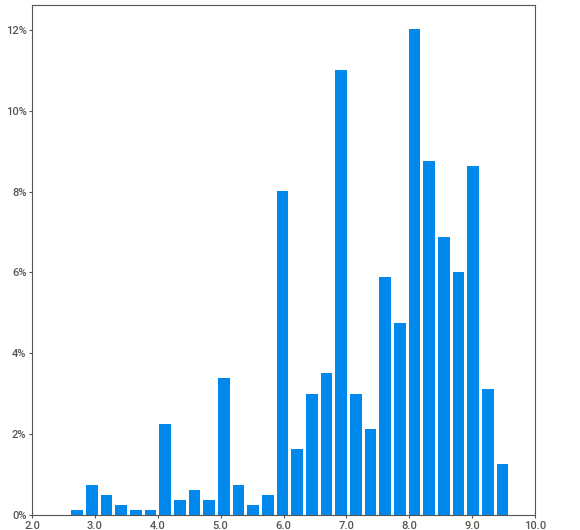
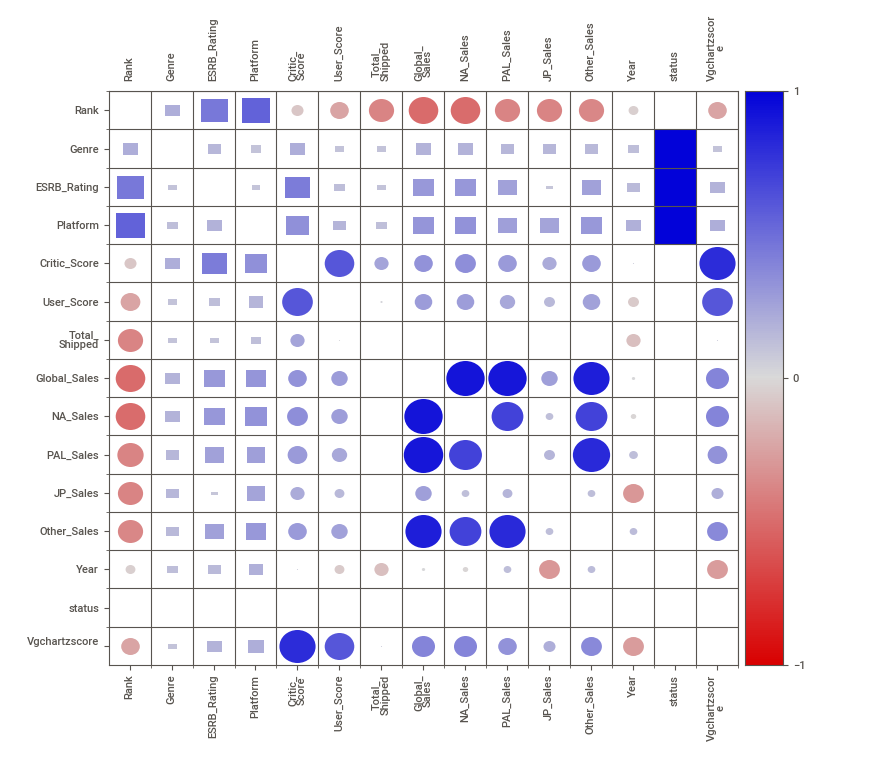
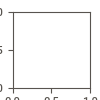

In [ ]:
import sweetviz as sv
from IPython.display import HTML

my_report = sv.analyze(df)
my_report.show_html()
HTML("/content/SWEETVIZ_REPORT.html")

## ベン図(カテゴリーデータの分布の比較)

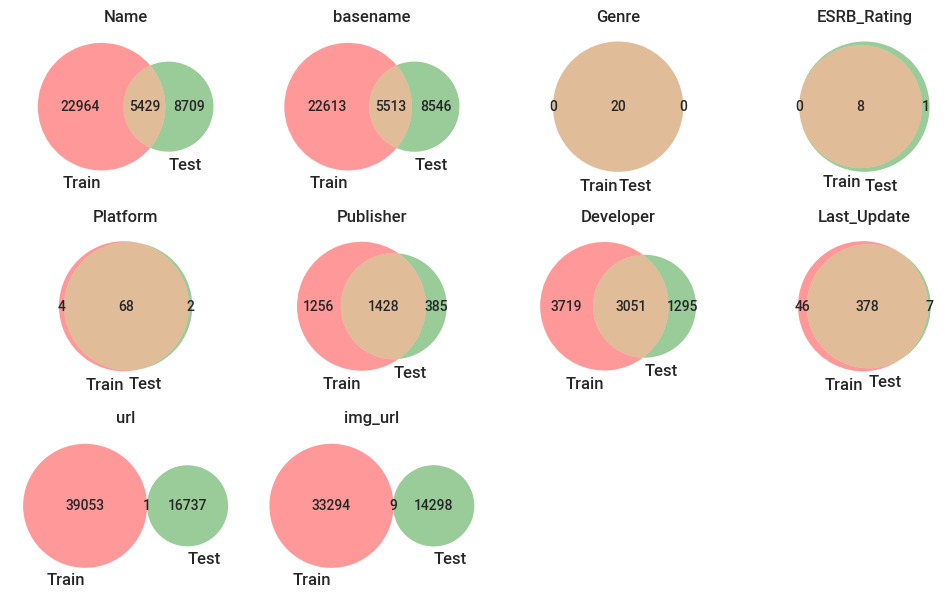

In [ ]:
from matplotlib_venn import venn2
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split

train, test = train_test_split(df, test_size=0.3, random_state=42)

plt.figure(figsize=(10, 20))

for i, column in enumerate(df.select_dtypes(include=object).columns):

    plt.subplot(10, 4, i+1)
    set1 = set(train[column])
    set2 = set(test[column])

    plt.title(column)
    venn2([set1, set2], ('Train', 'Test'))

plt.tight_layout()
plt.show()

## ヒストグラム(数値データの分布の比較)

nanの数 train: 0 test: 0


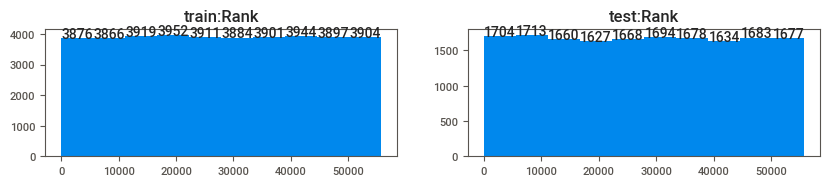

nanの数 train: 39054 test: 16738


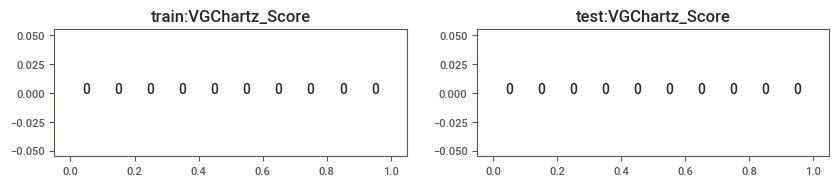

nanの数 train: 34503 test: 14753


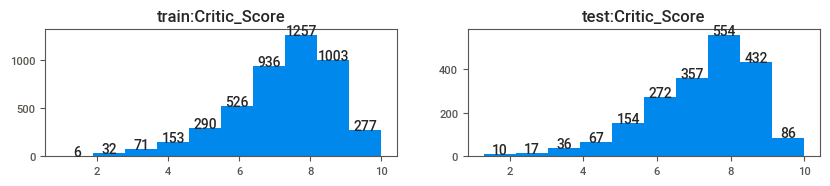

nanの数 train: 38824 test: 16633


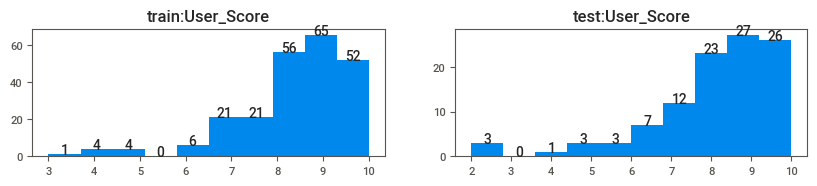

nanの数 train: 37761 test: 16204


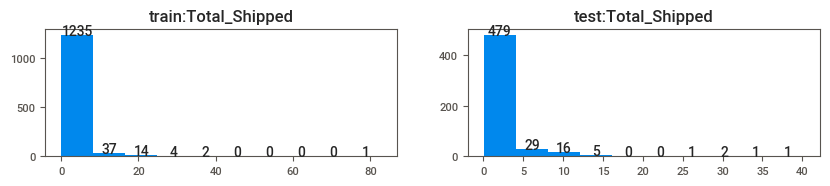

nanの数 train: 25514 test: 10863


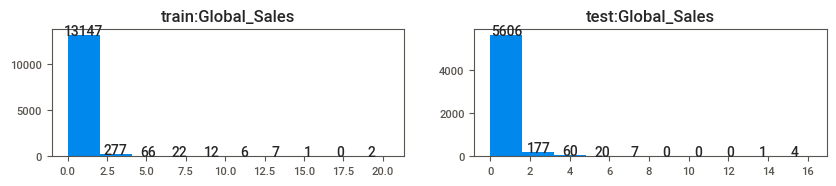

nanの数 train: 30042 test: 12786


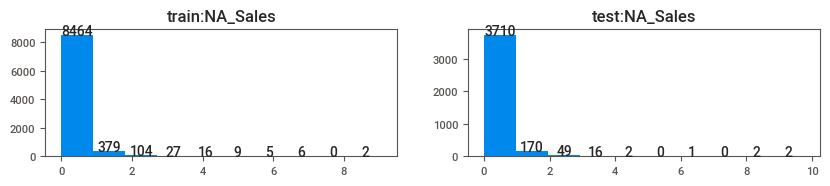

nanの数 train: 29887 test: 12716


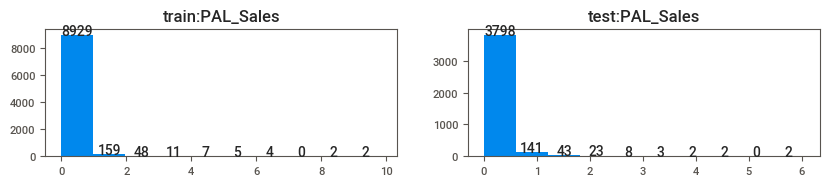

nanの数 train: 34145 test: 14604


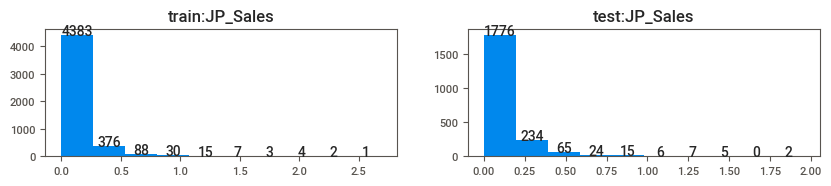

nanの数 train: 28280 test: 11990


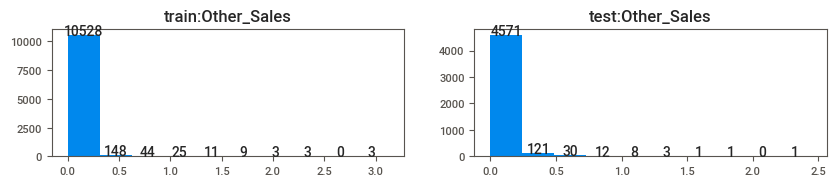

nanの数 train: 672 test: 307


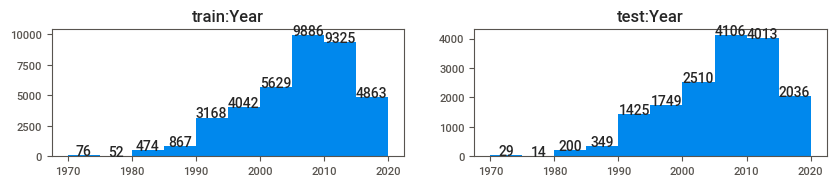

nanの数 train: 0 test: 0


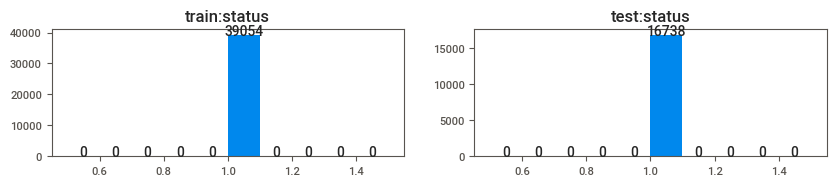

nanの数 train: 38489 test: 16504


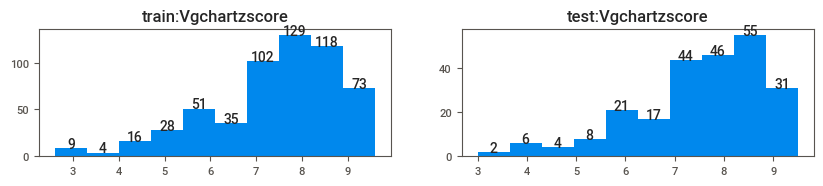

<Figure size 800x550 with 0 Axes>

In [ ]:
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split

train, test = train_test_split(df, test_size=0.3, random_state=42)

for i, column in enumerate(df.select_dtypes(include='number').columns):

    print("nanの数 train:", train[column].isnull().sum(), "test:", test[column].isnull().sum())

    plt.figure(figsize=(10, 40))

    plt.subplot(20, 2, i*2+1)
    plt.title("train:" + column)
    n, bins, _  = plt.hist(train[column].dropna())
    xs = (bins[:-1] + bins[1:])/2
    ys = n.astype(int)
    for x, y in zip(xs, ys):
        plt.text(x, y, str(y), horizontalalignment="center")

    plt.subplot(20, 2, i*2+2)
    plt.title("test:" + column)
    n, bins, _  = plt.hist(test[column].dropna())
    xs = (bins[:-1] + bins[1:])/2
    ys = n.astype(int)
    for x, y in zip(xs, ys):
        plt.text(x, y, str(y), horizontalalignment="center")

    plt.show()

plt.tight_layout()

## 相関係数のヒートマップ

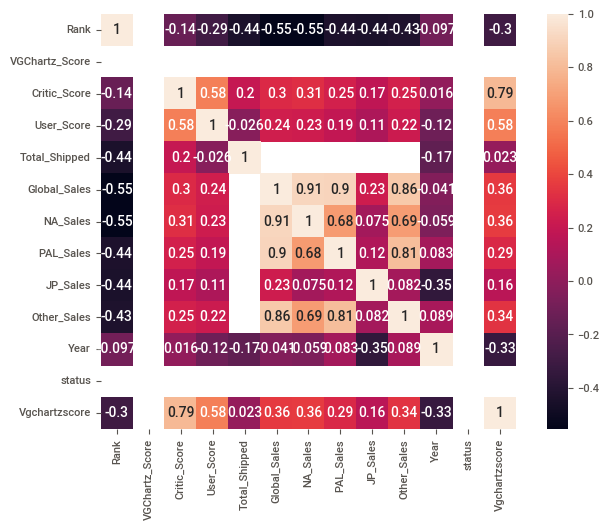

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

sns.heatmap(df.corr(), square=True, annot=True)

## PairPlot

<Figure size 4000x4000 with 0 Axes>

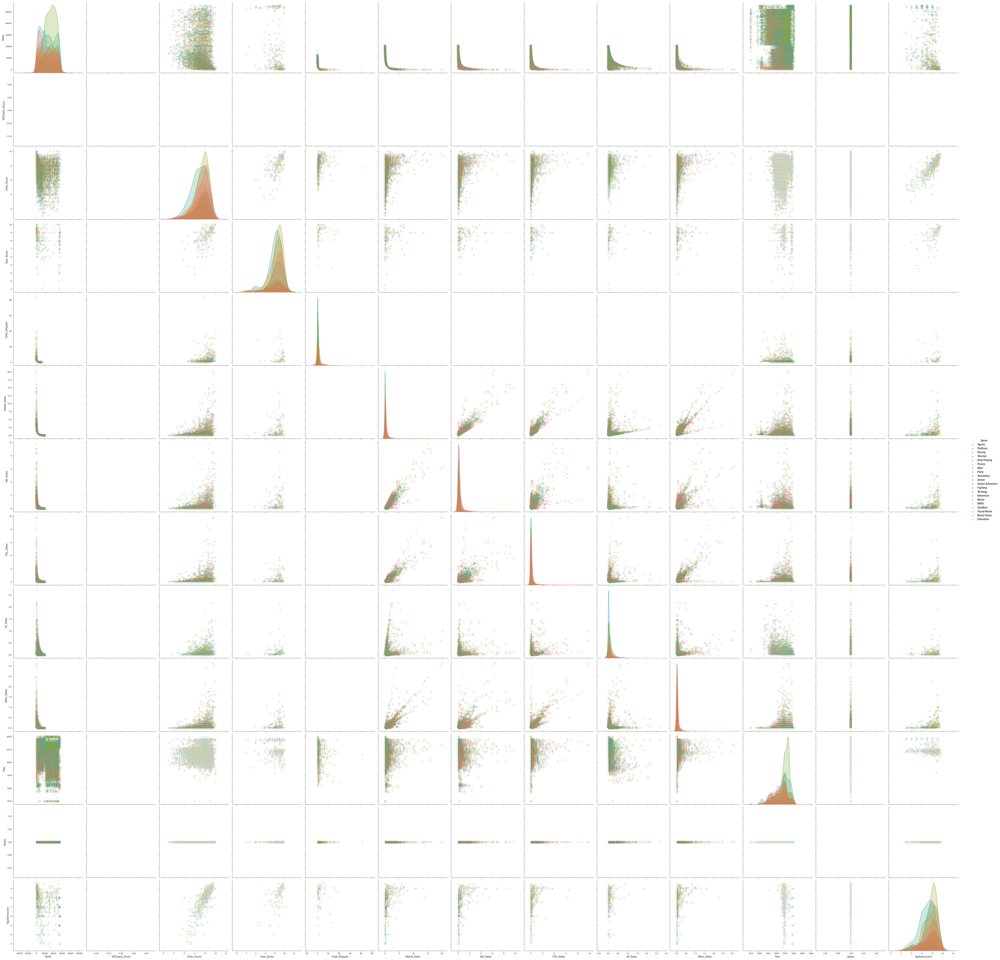

In [ ]:
import matplotlib
import seaborn as sns
import warnings 
warnings.filterwarnings('ignore')

plt.figure(figsize=(40, 40))
sns.pairplot(
             df, 
             hue='Genre', 
             diag_kind = 'kde',
             plot_kws = {'alpha': 0.6, 's': 80, 'edgecolor': 'k'},
             markers='+',
             height = 4
             );

In [ ]:
# 指定用の数値データカラム
df.select_dtypes(include="number").columns

Index(['Rank', 'VGChartz_Score', 'Critic_Score', 'User_Score', 'Total_Shipped',
       'Global_Sales', 'NA_Sales', 'PAL_Sales', 'JP_Sales', 'Other_Sales',
       'Year', 'status', 'Vgchartzscore'],
      dtype='object')

<Figure size 4000x4000 with 0 Axes>

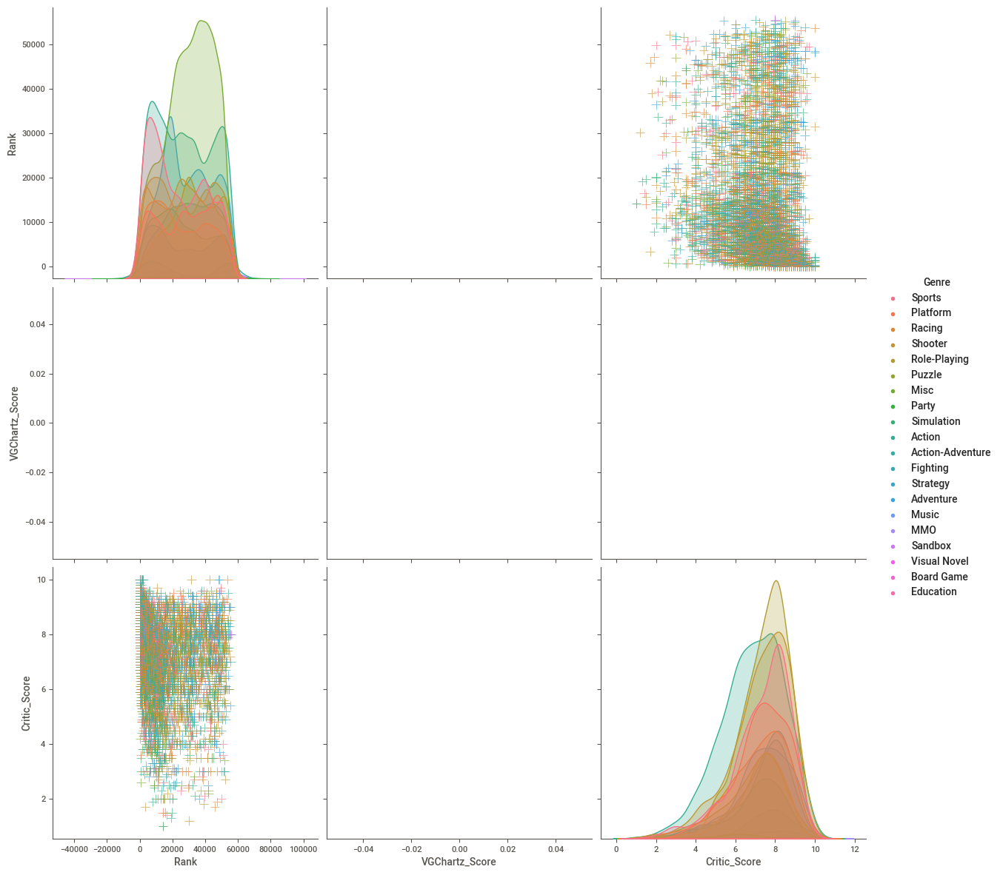

In [ ]:
# カラム指定
plt.figure(figsize=(40, 40))
sns.pairplot(
             df, 
             hue='Genre', 
             diag_kind = 'kde',
             plot_kws = {'alpha': 0.6, 's': 80, 'edgecolor': 'k'},
             vars = ['Rank', 'VGChartz_Score', 'Critic_Score'],
             markers='+',
             height = 4
             );